In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings("ignore")

2025-05-10 11:16:08.801322: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746875769.047807      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746875769.119537      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Configuration
DATA_DIR = "/kaggle/input/skin-cancer-disease-ham10000/Ham10000"
OUTPUT_DIR = "/kaggle/working/final_data"
PROCESSED_DIR = "/kaggle/working/processed_data"
TARGET_COUNT = 1100  # Number of images per class
RESIZE_DIM = (224, 224)  # Resize dimensions

# Ensure directories exist
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(PROCESSED_DIR, exist_ok=True)

# Initialize the Data Augmentation generator with improved parameters
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,  # Reduced from 0.2
    height_shift_range=0.1,  # Reduced from 0.2
    shear_range=0.1,  # Reduced from 0.2
    zoom_range=0.1,  # Reduced from 0.2
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',  # Changed from 'nearest'
    cval=0  # Fill with black (use 255 for white)
) 

# Function to load images in RGB format
def load_image_rgb(path):
    img = cv2.imread(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB immediately

# Function to save images in RGB format
def save_image_rgb(path, img):
    # If image is grayscale, convert to 3-channel
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    cv2.imwrite(path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))  # Convert back to BGR for saving

# Function to balance dataset (oversampling/undersampling) with Augmentation
def balance_dataset():
    for class_name in os.listdir(DATA_DIR):
        class_path = os.path.join(DATA_DIR, class_name)
        if not os.path.isdir(class_path):
            continue
        
        images = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
        image_count = len(images)
        
        output_class_dir = os.path.join(OUTPUT_DIR, class_name)
        os.makedirs(output_class_dir, exist_ok=True)
        
        # If the number of images is greater than the target, randomly sample
        if image_count > TARGET_COUNT:
            images = random.sample(images, TARGET_COUNT)
        
        # If the number of images is less than the target, apply augmentation
        elif image_count < TARGET_COUNT:
            images_to_add = TARGET_COUNT - image_count
            images_copy = list(images)  # Create a copy of the list of images
            
            # Apply augmentation to existing images until we reach TARGET_COUNT
            for img_path in tqdm(images_copy, desc=f"Augmenting {class_name}"):
                img = load_image_rgb(img_path)
                img = cv2.resize(img, RESIZE_DIM)
                img = img.reshape((1,) + img.shape)  # Reshape to (1, height, width, channels)

                # Generate augmented images and save them
                i = 0
                for batch in datagen.flow(img, batch_size=1, save_to_dir=output_class_dir, 
                                        save_prefix=class_name, save_format='jpg'):
                    i += 1
                    if i >= images_to_add // len(images_copy):  # Distribute augmentation evenly
                        break

        # Now copy original images to the output directory in RGB
        for idx, img_path in enumerate(tqdm(images, desc=f"Processing {class_name}")):
            img = load_image_rgb(img_path)
            img = cv2.resize(img, RESIZE_DIM)
            output_img_path = os.path.join(output_class_dir, f"{class_name}_{idx+1}.jpg")
            save_image_rgb(output_img_path, img)
    
    print("Dataset balanced and augmented successfully!")

In [3]:
# Function to check for black borders
def has_black_borders(img, threshold=10):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mask = gray > threshold
    return not np.all(mask)

# Function to remove black borders
def zoom_until_no_borders(img, zoom_step=10, min_size=50):
    while has_black_borders(img):
        h, w, _ = img.shape
        if h <= min_size or w <= min_size:
            break
        img = img[zoom_step:h - zoom_step, zoom_step:w - zoom_step]
    return img

# Function to apply thresholding
def apply_threshold(gray_image, lower_gray=20, upper_gray=100):
    return cv2.inRange(gray_image, lower_gray, upper_gray)

# Function to find and draw contours
def find_and_draw_contours(image, mask, min_contour_area=500):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    image_with_contours = image.copy()
    for contour in contours:
        if cv2.contourArea(contour) >= min_contour_area:
            cv2.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
    return image_with_contours

# Function to preprocess images
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    if has_black_borders(image):
        image = zoom_until_no_borders(image)
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    equalized = cv2.equalizeHist(blurred)
    resized_color = cv2.resize(image, RESIZE_DIM)
    resized_gray = cv2.resize(equalized, RESIZE_DIM)
    
    mask = apply_threshold(resized_gray)
    gray_highlighted = cv2.bitwise_and(resized_gray, resized_gray, mask=mask)
    color_with_contours = find_and_draw_contours(resized_color, mask)
    gray_with_contours = find_and_draw_contours(resized_gray, mask)
    
    return {
        "original": resized_color,
        "gray": resized_gray,
        "highlighted": gray_highlighted,
        "color_contour": color_with_contours,
        "gray_contour": gray_with_contours
    }

# Function to create processed dataset
def create_processed_dataset():
    for class_name in os.listdir(OUTPUT_DIR):
        class_path = os.path.join(OUTPUT_DIR, class_name)
        if not os.path.isdir(class_path):
            continue
        
        images = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
        images = random.sample(images, min(len(images), TARGET_COUNT))
        
        for img_path in tqdm(images, desc=f"Processing {class_name}"):
            processed_images = preprocess_image(img_path)
            for key, img in processed_images.items():
                output_class_dir = os.path.join(PROCESSED_DIR, key, class_name)
                os.makedirs(output_class_dir, exist_ok=True)
                output_img_path = os.path.join(output_class_dir, os.path.basename(img_path))
                cv2.imwrite(output_img_path, img)
    print("Processed dataset created successfully!")

# Function to count images in classes
def count_images_in_classes(dataset_path):
    class_counts = {}
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            num_images = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
            class_counts[class_name] = num_images
            print(f"Class '{class_name}': {num_images} images")
    return class_counts

# Run processes
balance_dataset()
create_processed_dataset()

# Example usage for counting images in a processed dataset
dataset_path = os.path.join(PROCESSED_DIR, "color_contour")
class_counts = count_images_in_classes(dataset_path)

Processing Dermatofibroma: 100%|██████████| 115/115 [00:00<00:00, 119.34it/s]


Dataset balanced and augmented successfully!


Processing Vascular lesions: 100%|██████████| 963/963 [00:03<00:00, 262.34it/s]


Processed dataset created successfully!
Class 'Melanocytic nevi': 1100 images
Class 'Melanoma': 1100 images
Class 'Basal cell carcinoma': 1014 images
Class 'Benign keratosis-like lesions': 1100 images
Class 'Dermatofibroma': 992 images
Class 'Actinic keratoses': 964 images
Class 'Vascular lesions': 963 images


In [4]:
# from sklearn.cluster import KMeans
# from sklearn.decomposition import PCA
# from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
# import shutil

# # Configuration
# CLUSTER_OUTPUT_DIR = "/kaggle/working/clusters"
# IMG_DIR = os.path.join(PROCESSED_DIR, "color_contour")  # Choose the variant to cluster
# N_CLUSTERS = 6
# RESIZE_DIM = (224, 224)

# # Load MobileNetV2 model for feature extraction
# base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
# feature_extractor = Model(inputs=base_model.input, outputs=GlobalAveragePooling2D()(base_model.output))

# # Prepare image paths
# image_paths = []
# for class_name in os.listdir(IMG_DIR):
#     class_path = os.path.join(IMG_DIR, class_name)
#     if not os.path.isdir(class_path):
#         continue
#     for file_name in os.listdir(class_path):
#         if file_name.lower().endswith(('jpg', 'jpeg', 'png')):
#             image_paths.append(os.path.join(class_path, file_name))

# # Extract features
# features = []
# for img_path in tqdm(image_paths, desc="Extracting features"):
#     img = cv2.imread(img_path)
#     img = cv2.resize(img, RESIZE_DIM)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img = preprocess_input(img)
#     img = np.expand_dims(img, axis=0)
#     feat = feature_extractor.predict(img, verbose=0)
#     features.append(feat.flatten())

# features = np.array(features)

# # Dimensionality reduction with PCA
# pca = PCA(n_components=50)
# features_pca = pca.fit_transform(features)

# # Clustering with KMeans
# kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42)
# cluster_labels = kmeans.fit_predict(features_pca)

# # Save clustered images
# for i in range(N_CLUSTERS):
#     os.makedirs(os.path.join(CLUSTER_OUTPUT_DIR, f"cluster_{i}"), exist_ok=True)

# for path, label in zip(image_paths, cluster_labels):
#     file_name = os.path.basename(path)
#     save_path = os.path.join(CLUSTER_OUTPUT_DIR, f"cluster_{label}", file_name)
#     shutil.copy(path, save_path)

# print("Clustering complete. Clustered images saved.")

I0000 00:00:1746876080.256842      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Extracting features:   0%|          | 0/7233 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1746876085.114704      95 service.cc:148] XLA service 0x79bd70002460 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746876085.115673      95 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746876085.583727      95 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1746876088.043727      95 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
Extracting features: 100%|██████████| 7233/7233 [07:23<00:00, 16.31it/s]


Clustering complete. Clustered images saved.


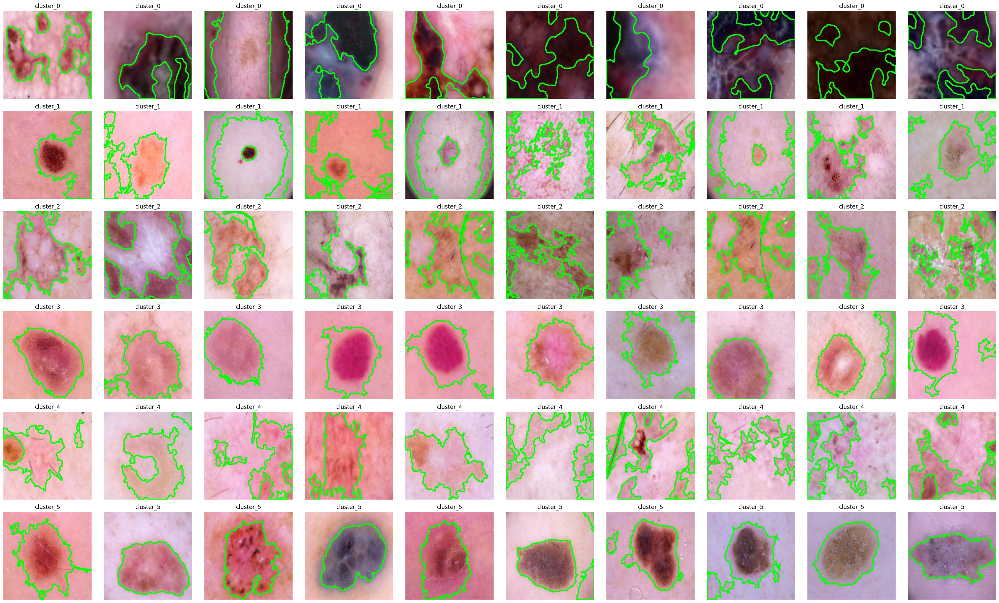

In [7]:
# def plot_cluster_samples(cluster_dir, samples_per_cluster=5, image_size=(224, 224)):
#     clusters = [d for d in os.listdir(cluster_dir) if os.path.isdir(os.path.join(cluster_dir, d))]
#     clusters.sort()  # Ensure cluster_0, cluster_1, etc.

#     plt.figure(figsize=(samples_per_cluster * 3, len(clusters) * 3))

#     for row_idx, cluster_name in enumerate(clusters):
#         cluster_path = os.path.join(cluster_dir, cluster_name)
#         images = [f for f in os.listdir(cluster_path) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
#         sampled_images = random.sample(images, min(samples_per_cluster, len(images)))

#         for col_idx, img_name in enumerate(sampled_images):
#             img_path = os.path.join(cluster_path, img_name)
#             img = cv2.imread(img_path)
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#             img = cv2.resize(img, image_size)

#             plt.subplot(len(clusters), samples_per_cluster, row_idx * samples_per_cluster + col_idx + 1)
#             plt.imshow(img)
#             plt.title(f"{cluster_name}")
#             plt.axis("off")

#     plt.tight_layout()
#     plt.show()

# # Example usage
# plot_cluster_samples("/kaggle/working/clusters", samples_per_cluster=10)

In [6]:
# from collections import defaultdict, Counter

# def get_class_from_filename(filename):
#     # Assumes filename is like 'melanoma_23.jpg' or from a path containing the class folder
#     return filename.split('_')[0]  # Modify this if needed based on your naming

# def analyze_clusters(cluster_dir):
#     cluster_class_counts = defaultdict(Counter)

#     for cluster_name in os.listdir(cluster_dir):
#         cluster_path = os.path.join(cluster_dir, cluster_name)
#         if not os.path.isdir(cluster_path):
#             continue

#         for fname in os.listdir(cluster_path):
#             if fname.lower().endswith(('jpg', 'jpeg', 'png')):
#                 class_name = get_class_from_filename(fname)
#                 cluster_class_counts[cluster_name][class_name] += 1

#     # Print results
#     for cluster, class_counter in cluster_class_counts.items():
#         print(f"\nCluster: {cluster}")
#         for class_name, count in class_counter.items():
#             print(f"  {class_name}: {count} images")

# # Example usage
# analyze_clusters("/kaggle/working/clusters")


Cluster: cluster_2
  Basal cell carcinoma: 207 images
  Vascular lesions: 32 images
  Melanoma: 331 images
  Melanocytic nevi: 125 images
  Benign keratosis-like lesions: 239 images
  Actinic keratoses: 254 images
  Dermatofibroma: 76 images

Cluster: cluster_4
  Dermatofibroma: 371 images
  Actinic keratoses: 380 images
  Basal cell carcinoma: 264 images
  Benign keratosis-like lesions: 240 images
  Melanocytic nevi: 14 images
  Vascular lesions: 147 images
  Melanoma: 23 images

Cluster: cluster_0
  Actinic keratoses: 72 images
  Melanoma: 101 images
  Basal cell carcinoma: 45 images
  Benign keratosis-like lesions: 73 images
  Vascular lesions: 116 images
  Melanocytic nevi: 21 images
  Dermatofibroma: 17 images

Cluster: cluster_1
  Basal cell carcinoma: 321 images
  Vascular lesions: 157 images
  Melanocytic nevi: 475 images
  Actinic keratoses: 156 images
  Dermatofibroma: 110 images
  Melanoma: 274 images
  Benign keratosis-like lesions: 267 images

Cluster: cluster_3
  Dermato


🔍 Training model for cluster_0...
✅ cluster_0 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.45
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step


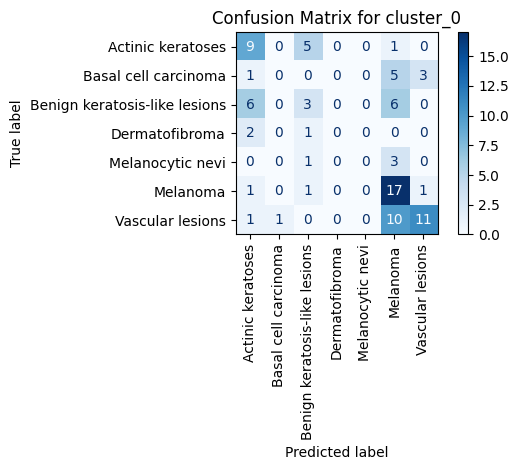


🔍 Training model for cluster_1...
✅ cluster_1 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.37
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


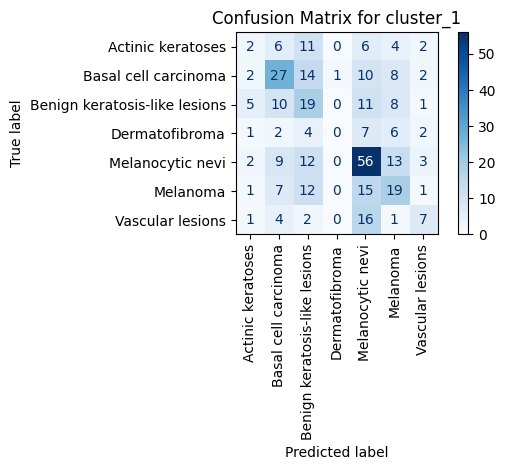


🔍 Training model for cluster_2...
✅ cluster_2 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.38
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step


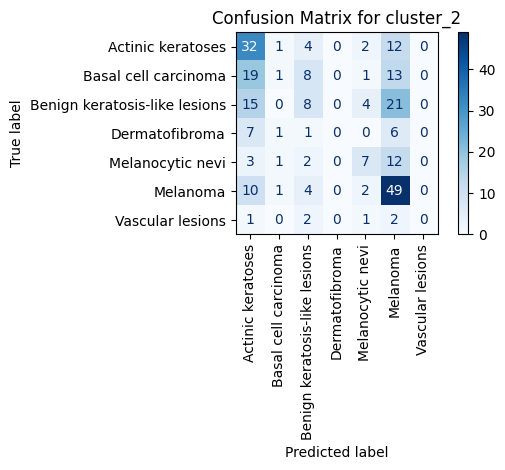


🔍 Training model for cluster_3...
✅ cluster_3 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.56
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step


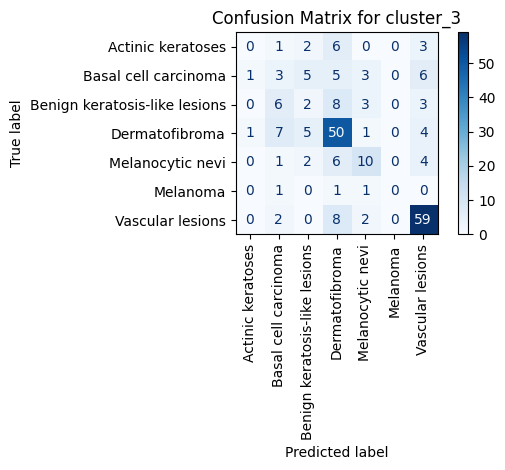


🔍 Training model for cluster_4...
✅ cluster_4 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.28
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


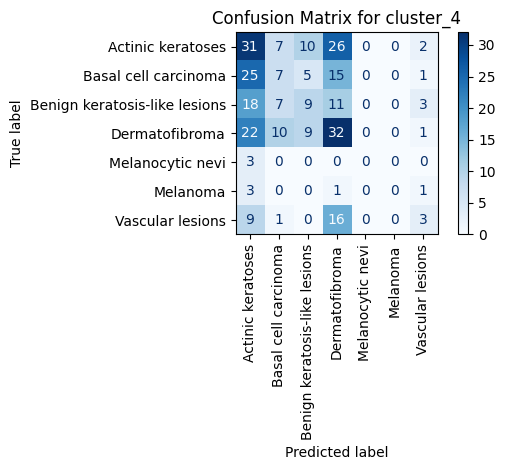


🔍 Training model for cluster_5...
✅ cluster_5 trained | Classes: ['Actinic keratoses', 'Basal cell carcinoma', 'Benign keratosis-like lesions', 'Dermatofibroma', 'Melanocytic nevi', 'Melanoma', 'Vascular lesions'] | Val Acc: 0.51
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step


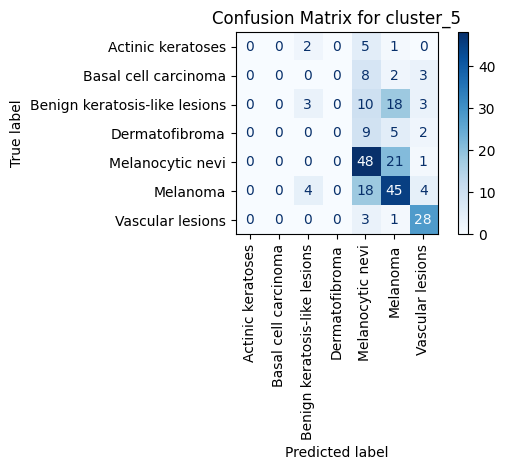

In [9]:
# import os
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import LabelEncoder
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# from tensorflow.keras.utils import to_categorical
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
# from tensorflow.keras.optimizers import Adam

# # Config
# CLUSTER_DIR = "/kaggle/working/clusters"
# IMG_SIZE = (224, 224)
# EPOCHS = 10
# BATCH_SIZE = 32
# LEARNING_RATE = 0.0001

# def get_class_from_filename(filename):
#     return filename.split('_')[0]

# def load_cluster_data(cluster_path):
#     images = []
#     labels = []
#     for fname in os.listdir(cluster_path):
#         if fname.lower().endswith(('jpg', 'jpeg', 'png')):
#             img_path = os.path.join(cluster_path, fname)
#             img = cv2.imread(img_path)
#             img = cv2.resize(img, IMG_SIZE)
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#             label = get_class_from_filename(fname)
#             images.append(img)
#             labels.append(label)
#     return np.array(images), np.array(labels)

# def create_cnn_model(num_classes):
#     model = Sequential([
#         Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
#         MaxPooling2D(2,2),
#         Conv2D(64, (3,3), activation='relu'),
#         MaxPooling2D(2,2),
#         Flatten(),
#         Dense(128, activation='relu'),
#         Dropout(0.3),
#         Dense(num_classes, activation='softmax')
#     ])
#     model.compile(optimizer=Adam(learning_rate=LEARNING_RATE),
#                   loss='categorical_crossentropy',
#                   metrics=['accuracy'])
#     return model

# for cluster_name in sorted(os.listdir(CLUSTER_DIR)):
#     cluster_path = os.path.join(CLUSTER_DIR, cluster_name)
#     if not os.path.isdir(cluster_path):
#         continue

#     print(f"\n🔍 Training model for {cluster_name}...")
#     X, y = load_cluster_data(cluster_path)

#     if len(np.unique(y)) < 2:
#         print(f"⚠️ Skipping {cluster_name} (only 1 class found)")
#         continue

#     X = X.astype('float32') / 255.0
#     le = LabelEncoder()
#     y_encoded = le.fit_transform(y)
#     y_cat = to_categorical(y_encoded)

#     X_train, X_val, y_train, y_val = train_test_split(X, y_cat, test_size=0.2, stratify=y_encoded, random_state=42)

#     model = create_cnn_model(num_classes=len(le.classes_))
#     history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
#                         epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0)

#     val_acc = history.history['val_accuracy'][-1]
#     print(f"✅ {cluster_name} trained | Classes: {list(le.classes_)} | Val Acc: {val_acc:.2f}")

#     # Predict and plot confusion matrix
#     y_pred = model.predict(X_val)
#     y_pred_classes = np.argmax(y_pred, axis=1)
#     y_true_classes = np.argmax(y_val, axis=1)

#     cm = confusion_matrix(y_true_classes, y_pred_classes)
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
#     disp.plot(cmap='Blues', xticks_rotation=90)
#     plt.title(f"Confusion Matrix for {cluster_name}")
#     plt.tight_layout()
#     plt.show()

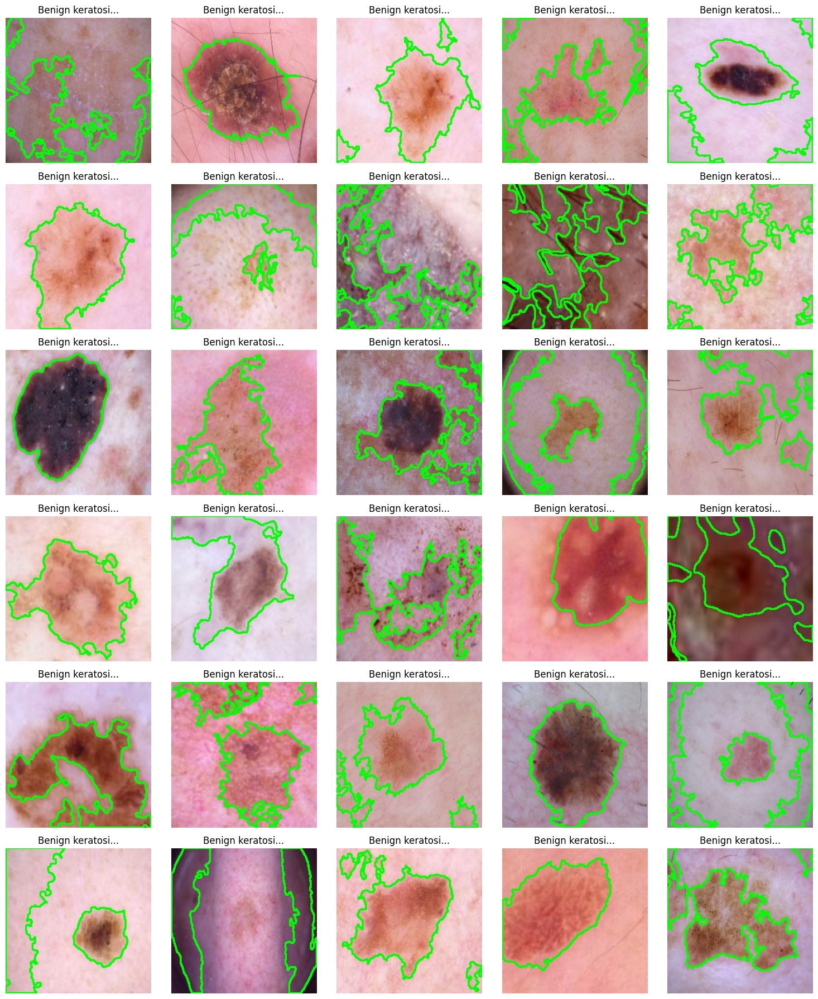

In [4]:
def display_random_images(directory, num_images=30, cols=5):
    """
    Display random images from a directory.
    
    Args:
        directory (str): Path to the directory containing images
        num_images (int): Number of random images to display
        cols (int): Number of columns in the display grid
    """
    # Get all image files from the directory
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']
    image_files = [f for f in os.listdir(directory) 
                  if os.path.splitext(f)[1].lower() in image_extensions]
    
    if not image_files:
        print("No images found in the directory.")
        return
    
    # Select random images
    if len(image_files) < num_images:
        print(f"Warning: Only {len(image_files)} images found. Displaying all.")
        selected_files = image_files
    else:
        selected_files = random.sample(image_files, num_images)
    
    # Calculate rows needed
    rows = (num_images + cols - 1) // cols
    
    # Create figure
    plt.figure(figsize=(15, 3 * rows))
    
    # Display each image
    for i, filename in enumerate(selected_files, 1):
        img_path = os.path.join(directory, filename)
        try:
            # Read image (convert BGR to RGB for matplotlib)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Could not read image: {filename}")
                continue
                
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Add subplot and show image
            plt.subplot(rows, cols, i)
            plt.imshow(img_rgb)
            plt.title(filename[:15] + '...' if len(filename) > 15 else filename)
            plt.axis('off')
            
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    
    plt.tight_layout()
    plt.show()

# Example usage
image_directory = "/kaggle/working/processed_data/color_contour/Benign keratosis-like lesions"  # Replace with your image directory path
display_random_images(image_directory, num_images=30)

In [5]:
# Parameters
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 50
NUM_CLASSES = 7  # You have 7 skin disease classes

# Load the data
train_datagen = ImageDataGenerator(
    validation_split=0.2,
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2]
)

train_generator = train_datagen.flow_from_directory(
    '/kaggle/working/processed_data/color_contour',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = train_datagen.flow_from_directory(
    '/kaggle/working/processed_data/color_contour',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

Found 5785 images belonging to 7 classes.
Found 1444 images belonging to 7 classes.


In [10]:
# Build the model
model_try = Sequential([
    # Block 1
    Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(224, 224, 3)),
    BatchNormalization(),
    Conv2D(32, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    # Block 2
    Conv2D(64, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Conv2D(64, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    # Block 3
    Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    # Block 4
    Conv2D(256, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Conv2D(256, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    # Block 5
    Conv2D(512, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    Conv2D(512, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Conv2D(512, (1,1), activation='relu', padding='same', kernel_regularizer=l2(0.001)),  # Depth increase without changing dimensions
    BatchNormalization(),
    MaxPooling2D(2, 2),

    # Block 6
    Conv2D(1024, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    Conv2D(1024, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Conv2D(1024, (1,1), activation='relu', padding='same', kernel_regularizer=l2(0.001)),  # Depth increase without changing dimensions
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    # # Block 6
    # Conv2D(1024, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    # BatchNormalization(),
    # MaxPooling2D(2, 2),

    # Classification head
    GlobalAveragePooling2D(),  # Replaces Flatten, reduces overfitting
    Dropout(0.5),
    Dense(1024, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile the model
model_try.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True),
    #ModelCheckpoint('best_model.h5', save_best_only=True)
]


class_weights = compute_class_weight('balanced',
                                     classes=np.unique(train_generator.classes),
                                     y=train_generator.classes)

class_weight_dict = dict(enumerate(class_weights))

# Train
model_try.fit(
    train_generator,
    class_weight=class_weight_dict,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=callbacks
)

Epoch 1/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 116s 507ms/step - accuracy: 0.2672 - loss: 8.2123 - val_accuracy: 0.1302 - val_loss: 8.3582
Epoch 2/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 439ms/step - accuracy: 0.4200 - loss: 7.3102 - val_accuracy: 0.1503 - val_loss: 8.0503
Epoch 3/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 441ms/step - accuracy: 0.4705 - loss: 7.0353 - val_accuracy: 0.3310 - val_loss: 7.2335
Epoch 4/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 437ms/step - accuracy: 0.4920 - loss: 6.8304 - val_accuracy: 0.5388 - val_loss: 6.5750
Epoch 5/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 437ms/step - accuracy: 0.5017 - loss: 6.6201 - val_accuracy: 0.5554 - val_loss: 6.4096
Epoch 6/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 439ms/step - accuracy: 0.5375 - loss: 6.4096 - val_accuracy: 0.5630 - val_loss: 6.2058
Epoch 7/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 436ms/step - accuracy: 0.5439 - loss: 6.2102 - val_accuracy: 0.4965 - val_loss: 6.1884
Epoch 8/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 82s 440ms/step - accuracy: 0.5744 - loss: 

46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 368ms/step


<Figure size 1000x800 with 0 Axes>

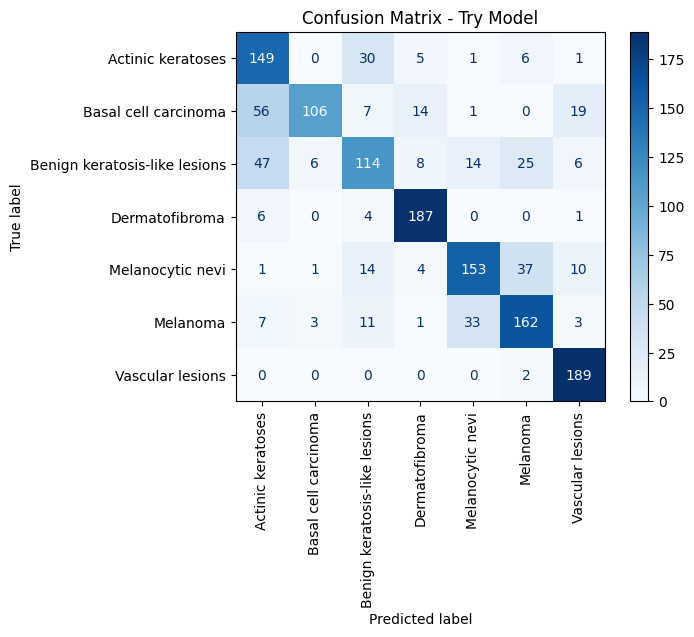

In [ ]:
# Get true labels
y_true = val_generator.classes

# Get predicted labels
y_pred_probs = model_try.predict(val_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Class labels
class_labels = list(val_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix - Try Model")
plt.show()

In [9]:
model_try.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 256)         │         590,0

 Total params: 25,198,455 (96.12 MB)

 Trainable params: 8,397,479 (32.03 MB)

 Non-trainable params: 6,016 (23.50 KB)

 Optimizer params: 16,794,960 (64.07 MB)

In [7]:
# Build the model
model_cnn = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    Conv2D(64, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    Conv2D(128, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(256, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    Conv2D(256, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),

    Conv2D(512, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(1024, (3,3), activation='relu',kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),


    Flatten(),
    Dropout(0.5),
    Dense(1024, activation='relu',kernel_regularizer=l2(0.001)),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile the model
model_cnn.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True),
    #ModelCheckpoint('best_model.h5', save_best_only=True)
]


class_weights = compute_class_weight('balanced',
                                     classes=np.unique(train_generator.classes),
                                     y=train_generator.classes)

class_weight_dict = dict(enumerate(class_weights))

# Train
model_cnn.fit(
    train_generator,
    class_weight=class_weight_dict,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=callbacks
)

Epoch 1/50


I0000 00:00:1746617466.371257     114 service.cc:148] XLA service 0x78171c00c2a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746617466.372176     114 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746617467.288084     114 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/181 ━━━━━━━━━━━━━━━━━━━━ 56:45 19s/step - accuracy: 0.0312 - loss: 6.0556

I0000 00:00:1746617474.762430     114 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


181/181 ━━━━━━━━━━━━━━━━━━━━ 108s 498ms/step - accuracy: 0.3339 - loss: 4.7326 - val_accuracy: 0.1304 - val_loss: 4.9564
Epoch 2/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 451ms/step - accuracy: 0.4247 - loss: 4.1538 - val_accuracy: 0.1380 - val_loss: 6.5061
Epoch 3/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 85s 454ms/step - accuracy: 0.4783 - loss: 3.9802 - val_accuracy: 0.2746 - val_loss: 4.9916
Epoch 4/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 86s 459ms/step - accuracy: 0.5017 - loss: 3.8394 - val_accuracy: 0.4598 - val_loss: 3.9165
Epoch 5/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 85s 455ms/step - accuracy: 0.4985 - loss: 3.8086 - val_accuracy: 0.5243 - val_loss: 3.8102
Epoch 6/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 450ms/step - accuracy: 0.5337 - loss: 3.7233 - val_accuracy: 0.5527 - val_loss: 3.6914
Epoch 7/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 452ms/step - accuracy: 0.5369 - loss: 3.6792 - val_accuracy: 0.5652 - val_loss: 3.6022
Epoch 8/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 448ms/step - accuracy: 0.5562 - loss: 3.6094 - va

46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 371ms/step


<Figure size 1000x800 with 0 Axes>

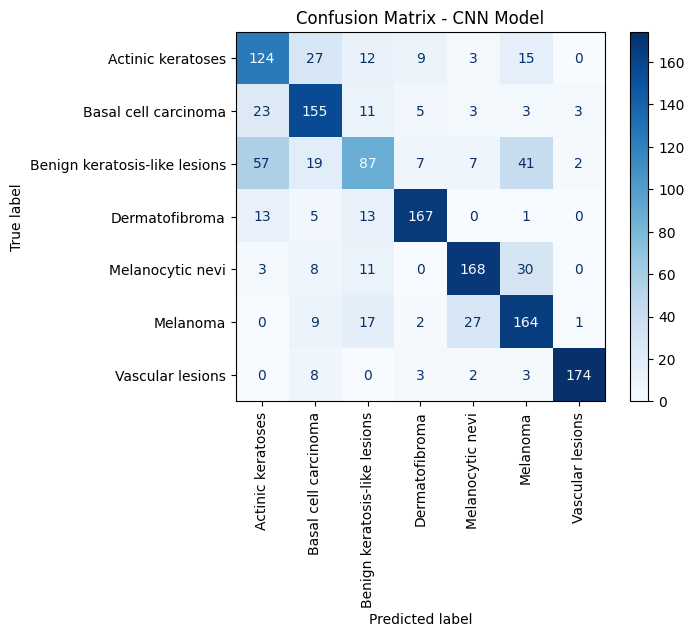

In [8]:
# Get true labels
y_true = val_generator.classes

# Get predicted labels
y_pred_probs = model_cnn.predict(val_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Class labels
class_labels = list(val_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix - CNN Model")
plt.show()

In [9]:
# Load base model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = True

# Optionally, freeze only the first N layers
for layer in base_model.layers[:100]:
    layer.trainable = False

# Start building model
x = base_model.output  # <- This is a 4D tensor

x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = MaxPooling2D()(x)
x = Dropout(0.3)(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = MaxPooling2D()(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

model_MobileNetV2 = Model(inputs=base_model.input, outputs=predictions)

# Compile
model_MobileNetV2.compile(optimizer=Adam(1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


class_weights = compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weights = dict(enumerate(class_weights))


# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True),
    #ModelCheckpoint('mobilenetv2_best_model.keras', save_best_only=True)
]

# Train
model_MobileNetV2.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=callbacks,
    class_weight=class_weights
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


E0000 00:00:1746622714.768279     115 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1746622714.965252     115 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


 88/181 ━━━━━━━━━━━━━━━━━━━━ 33s 360ms/step - accuracy: 0.1600 - loss: 1.9407

E0000 00:00:1746622758.524321     113 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1746622758.719847     113 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


181/181 ━━━━━━━━━━━━━━━━━━━━ 134s 550ms/step - accuracy: 0.1598 - loss: 1.9423 - val_accuracy: 0.1921 - val_loss: 1.9355
Epoch 2/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 450ms/step - accuracy: 0.1979 - loss: 1.9139 - val_accuracy: 0.3148 - val_loss: 1.8147
Epoch 3/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 451ms/step - accuracy: 0.2587 - loss: 1.7800 - val_accuracy: 0.3793 - val_loss: 1.6192
Epoch 4/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 85s 453ms/step - accuracy: 0.3722 - loss: 1.5877 - val_accuracy: 0.4563 - val_loss: 1.3694
Epoch 5/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 450ms/step - accuracy: 0.4544 - loss: 1.3943 - val_accuracy: 0.5250 - val_loss: 1.2371
Epoch 6/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 451ms/step - accuracy: 0.4961 - loss: 1.2800 - val_accuracy: 0.5458 - val_loss: 1.1672
Epoch 7/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 85s 457ms/step - accuracy: 0.5437 - loss: 1.1914 - val_accuracy: 0.5700 - val_loss: 1.1000
Epoch 8/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 84s 451ms/step - accuracy: 0.5502 - loss: 1.1667 - va

46/46 ━━━━━━━━━━━━━━━━━━━━ 23s 430ms/step


<Figure size 1000x800 with 0 Axes>

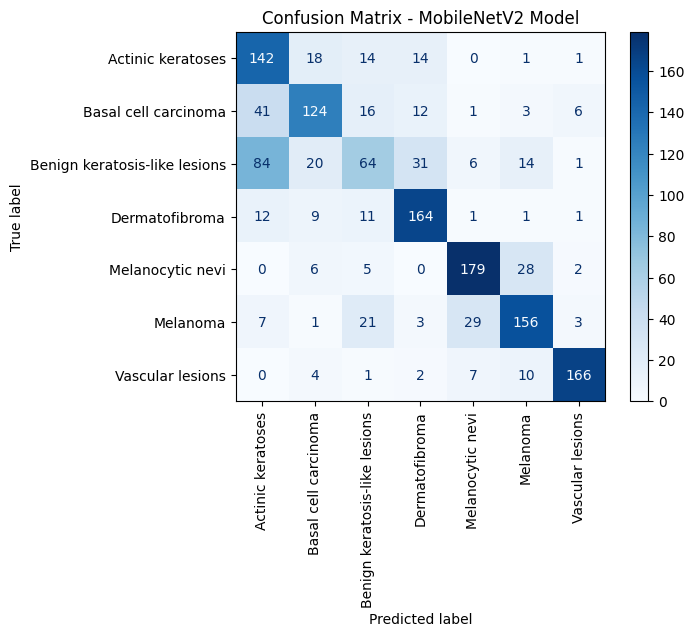

In [11]:
# Get true labels
y_true = val_generator.classes

# Get predicted labels
y_pred_probs = model_MobileNetV2.predict(val_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Class labels
class_labels = list(val_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix - MobileNetV2 Model")
plt.show()

In [12]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

# Final model
model_VGG16 = Model(inputs=base_model.input, outputs=predictions)

# Compile
model_VGG16.compile(optimizer=Adam(learning_rate=0.0005),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True),
]

# Train
model_VGG16.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=callbacks
)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 102s 489ms/step - accuracy: 0.1761 - loss: 2.0283 - val_accuracy: 0.2995 - val_loss: 1.8004
Epoch 2/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 432ms/step - accuracy: 0.2252 - loss: 1.8763 - val_accuracy: 0.3655 - val_loss: 1.7259
Epoch 3/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 434ms/step - accuracy: 0.2817 - loss: 1.7832 - val_accuracy: 0.3725 - val_loss: 1.6857
Epoch 4/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 80s 428ms/step - accuracy: 0.2873 - loss: 1.7541 - val_accuracy: 0.3767 - val_loss: 1.6468
Epoch 5/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 433ms/step - accuracy: 0.2925 - loss: 1.7381 - val_accuracy: 0.3732 - val_loss: 1.6148
Epoch 6/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 435ms/step - accuracy: 0.3089 - loss: 1.7031 - val_accuracy: 0.4093 - val_loss: 1.5923
Epoch 7/30
181/181 ━━━━━━━━━━━━━━━━━━━━ 81s 433ms/step - accuracy: 0.3195 - loss: 1.6957 - val_accuracy: 0.4204 - val_loss: 1.5705
Epoch 8/30
181/181 ━━━━━━━━━━━━

45/45 ━━━━━━━━━━━━━━━━━━━━ 16s 353ms/step


<Figure size 1000x800 with 0 Axes>

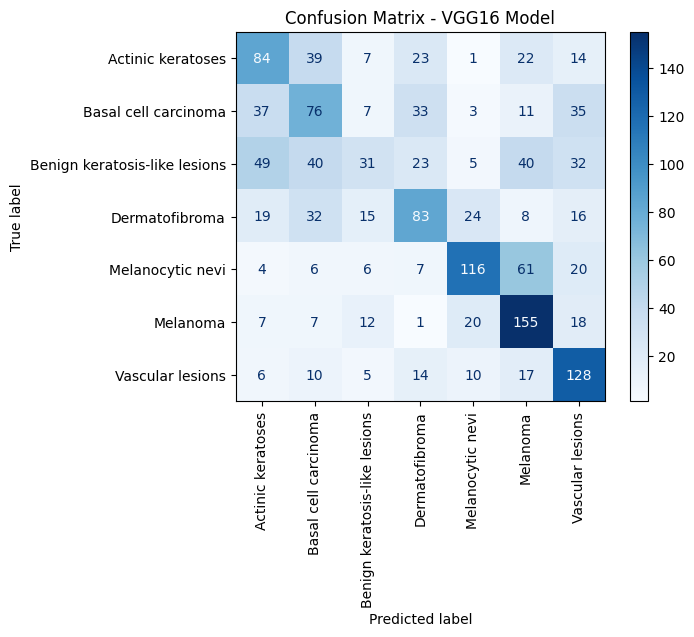

In [14]:
# Get true labels
y_true = val_generator.classes

# Get predicted labels
y_pred_probs = model_VGG16.predict(val_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Class labels
class_labels = list(val_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix - VGG16 Model")
plt.show()